# DETR for Fire detection

## Getting ready the environment

In [ ]:
# Identifying Nvidia GPU
!nvidia-smi

Thu May 18 17:04:30 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   50C    P8    10W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
# Importing torch and checking GPU detection
import torch
"GPU onfire" if torch.cuda.is_available() else "GPU out"

'GPU onfire'

In [ ]:
# Importing "os" and definning "HOME" path
import os
HOME = os.getcwd()
print(HOME)

/content


Setting environemnt: intalling packages

In [ ]:
!pip install -i https://test.pypi.org/simple/ supervision==0.3.0
!pip install -q transformers
!pip install -q pytorch-lightning
!pip install -q roboflow
!pip install -q timm

Looking in indexes: https://test.pypi.org/simple/, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.1/7.1 MB 9.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 224.5/224.5 kB 17.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 27.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 719.0/719.0 kB 13.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 519.2/519.2 kB 48.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 65.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 114.5/114.5 kB 13.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 268.8/268.8 kB 25.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 149.6/149.6 kB 16.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 kB 3.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 6.7 MB/s eta 0:00:00
     ━━━━━━━━

Checking versions and importing libraries

In [ ]:
# checking
!nvcc --version # NVIDIA version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2]) # TORCH version
CUDA_VERSION = torch.__version__.split("+")[-1] # CUDA version
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)

# Libraries
import roboflow # to download and manage Roboflow dataset
import supervision # useful computer vision tool (from Roboflow)
import transformers # models origin
import pytorch_lightning # trainning/executing model

print( # libraries version log
    "roboflow:", roboflow.__version__,
    "; supervision:", supervision.__version__,
    "; transformers:", transformers.__version__,
    "; pytorch_lightning:", pytorch_lightning.__version__
)

# Selecting device to process
DEVICE = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2022 NVIDIA Corporation
Built on Wed_Sep_21_10:33:58_PDT_2022
Cuda compilation tools, release 11.8, V11.8.89
Build cuda_11.8.r11.8/compiler.31833905_0
torch:  2.0 ; cuda:  cu118
roboflow: 1.0.9 ; supervision: 0.3.0 ; transformers: 4.29.2 ; pytorch_lightning: 2.0.2


## Load Dataset
Following [Roboflow guide](https://github.com/roboflow/notebooks/blob/main/notebooks/train-huggingface-detr-on-custom-dataset.ipynb) to download the [selected dataset](https://universe.roboflow.com/fire-detection/fire-data-annotations/dataset/5#).
In our case we need the dataset as COCO format. By means of json files are defined the image detection for trainning.

In [ ]:
# Creating a folder to storage the dataset (we move into it)
!mkdir {HOME}/datasets
%cd {HOME}/datasets

# libraries
from roboflow import Roboflow # to download dataset
from getpass import getpass # to manage Roboflow password

# ask for our password to https://app.roboflow.com/
ROBOPASS = getpass("Roboflow password")

# download dataset
rf = Roboflow(api_key=ROBOPASS) # Roboflow class
project = rf.workspace("fire-detection").project("fire-data-annotations") # selecting out project
dataset = project.version(5).download("coco") # selecting data format (COCO)

/content/datasets
Roboflow password··········
loading Roboflow workspace...
loading Roboflow project...

Extracting Dataset Version Zip to Fire-Data-Annotations-5 in coco:: 100%|██████████| 3290/3290 [00:02<00:00, 1554.98it/s]


In [ ]:
dataset.location # Checking dataset location

'/content/datasets/Fire-Data-Annotations-5'

## Model origin loading selection
In this section we can choose between loading facebook model in order to train it, or an already trained model from local file.
* local = False -> Facebook model
* local = True -> our pre-trained model

From the libraries of the model, DETR:

* [DetrForObjectDetection](https://huggingface.co/docs/transformers/v4.28.1/en/model_doc/detr#transformers.DetrForObjectDetection): DETR model for object detection.

* [DetrImageProcessor](https://huggingface.co/docs/transformers/v4.28.1/en/model_doc/detr#transformers.DetrImageProcessor): image toolbox.


In [ ]:
# libraries
from transformers import DetrForObjectDetection, DetrImageProcessor

# origin model selection
local = True


### Loading Facebook model

In [ ]:
if not local:

  CHECKPOINT = 'facebook/detr-resnet-50' # origin model to setting images and to model loading
  # modelo de partida
  MODEL_ORIGIN = CHECKPOINT

  # loading image tools (https://huggingface.co/docs/transformers/main_classes/image_processor)
  image_processor = DetrImageProcessor.from_pretrained(CHECKPOINT)


### Loading local model

In [ ]:
if local:
  # copy from our google drive folder
  !cp -a /content/drive/MyDrive/custom_model_50epochs_batchacum3/custom-model /content/custom-model

  CHECKPOINT = 'facebook/detr-resnet-50' # for the image tools
  MODEL_PATH = '/content/custom-model' # transformer model

  # starting model
  MODEL_ORIGIN = MODEL_PATH

  # loading image tools (https://huggingface.co/docs/transformers/main_classes/image_processor)
  image_processor = DetrImageProcessor.from_pretrained(CHECKPOINT)

## Loading selected model

In [ ]:
# loading model
model = DetrForObjectDetection.from_pretrained(MODEL_ORIGIN)
model.to(DEVICE) # to selected device

DetrForObjectDetection(
  (model): DetrModel(
    (backbone): DetrConvModel(
      (conv_encoder): DetrConvEncoder(
        (model): FeatureListNet(
          (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
          (bn1): DetrFrozenBatchNorm2d()
          (act1): ReLU(inplace=True)
          (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
          (layer1): Sequential(
            (0): Bottleneck(
              (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
              (bn1): DetrFrozenBatchNorm2d()
              (act1): ReLU(inplace=True)
              (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
              (bn2): DetrFrozenBatchNorm2d()
              (drop_block): Identity()
              (act2): ReLU(inplace=True)
              (aa): Identity()
              (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      

## Create COCO data loaders
DETR model is trained by COCO format dataset, so the easiest way is to use a COCO dataset as well. We have to create our own dataset loader to accomplish the trainning.

In [ ]:
# Let's move to our dataset folder
!cd /content/datasets/Fire-Data-Annotations-5
!ls


Fire-Data-Annotations-5


Herebelow we define a pytorch dataset based on the [Hugging Face guide](https://huggingface.co/docs/transformers/main/tasks/object_detection). Every dataset element is an image with its annotations. As [torchvision](https://pytorch.org/vision/stable/index.html) provides a CocoDetection class, we will use it. We just add an image processor class (DetrImageProcessor) in order to adapt the image size and normalize them, as normalize the annotations (COCO format) to the DETR expected format and proper size.


In [ ]:
# libraries
import torchvision
# torchvision consist of : datasets, models and image transformations for CV


# configuration
ANNOTATION_FILE_NAME = "_annotations.coco.json" # annotation file
TRAIN_DIRECTORY = os.path.join(dataset.location, "train") # trainning folder
TEST_DIRECTORY = os.path.join(dataset.location, "test") # evaluation folder

# CocoDetection class
class CocoDetection(torchvision.datasets.CocoDetection):
    def __init__(
        self,
        image_directory_path: str,
        image_processor,
        train: bool = True
    ):
        annotation_file_path = os.path.join(image_directory_path, ANNOTATION_FILE_NAME)
        super(CocoDetection, self).__init__(image_directory_path, annotation_file_path)
        self.image_processor = image_processor

    def __getitem__(self, idx):
        #print('idx:', idx)
        images, annotations = super(CocoDetection, self).__getitem__(idx)
        image_id = self.ids[idx]
        annotations = {'image_id': image_id, 'annotations': annotations}
        encoding = self.image_processor(images=images, annotations=annotations, return_tensors="pt")
        # Return_tensors = “pt” tokenize in order to return Pytorch tensor
        pixel_values = encoding["pixel_values"].squeeze() # remove extra dimensions (batch)
        target = encoding["labels"][0]

        return pixel_values, target

# trainning dataset
TRAIN_DATASET = CocoDetection(
    image_directory_path=TRAIN_DIRECTORY,
    image_processor=image_processor,
    train=True)

# test dataset
TEST_DATASET = CocoDetection(
    image_directory_path=TEST_DIRECTORY,
    image_processor=image_processor,
    train=False)

print("Trainning samples:", len(TRAIN_DATASET))
print("Test samples:", len(TEST_DATASET))

loading annotations into memory...
Done (t=0.04s)
creating index...
index created!
loading annotations into memory...
Done (t=0.01s)
creating index...
index created!
Number of training examples: 2621
Number of test examples: 663


## Watch input data

In [ ]:
# dataset labels
categories = TRAIN_DATASET.coco.cats
print(categories.items())

# "none" expected in this DETR model
id2label = {k: v['name'] for k,v in categories.items()}
print(id2label)

dict_items([(0, {'id': 0, 'name': 'Fire-and-No-fire', 'supercategory': 'none'}), (1, {'id': 1, 'name': 'Fire', 'supercategory': 'Fire-and-No-fire'})])
{0: 'Fire-and-No-fire', 1: 'Fire'}


Libraries for working with the images. We use [supervision for working with the annotations.](https://roboflow.github.io/supervision/detection/core/#supervision.detection.core.Detections)


Image #1089


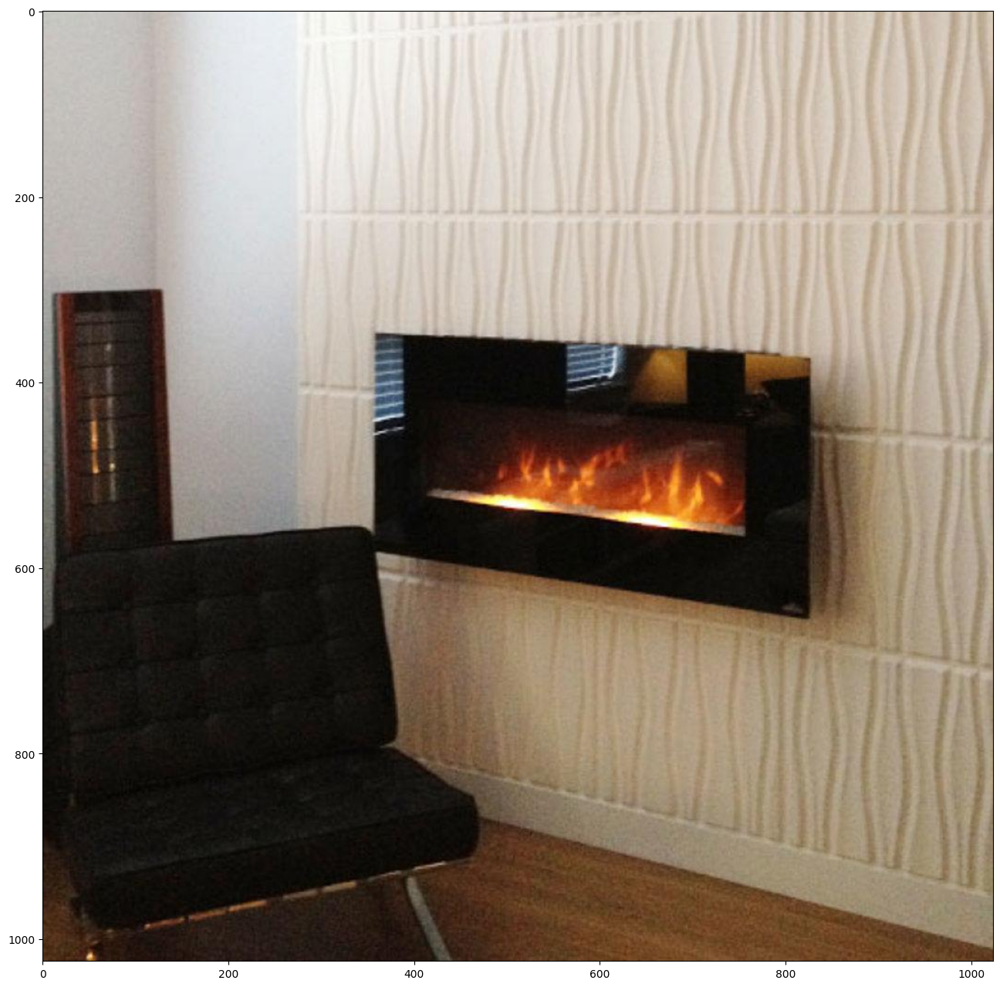

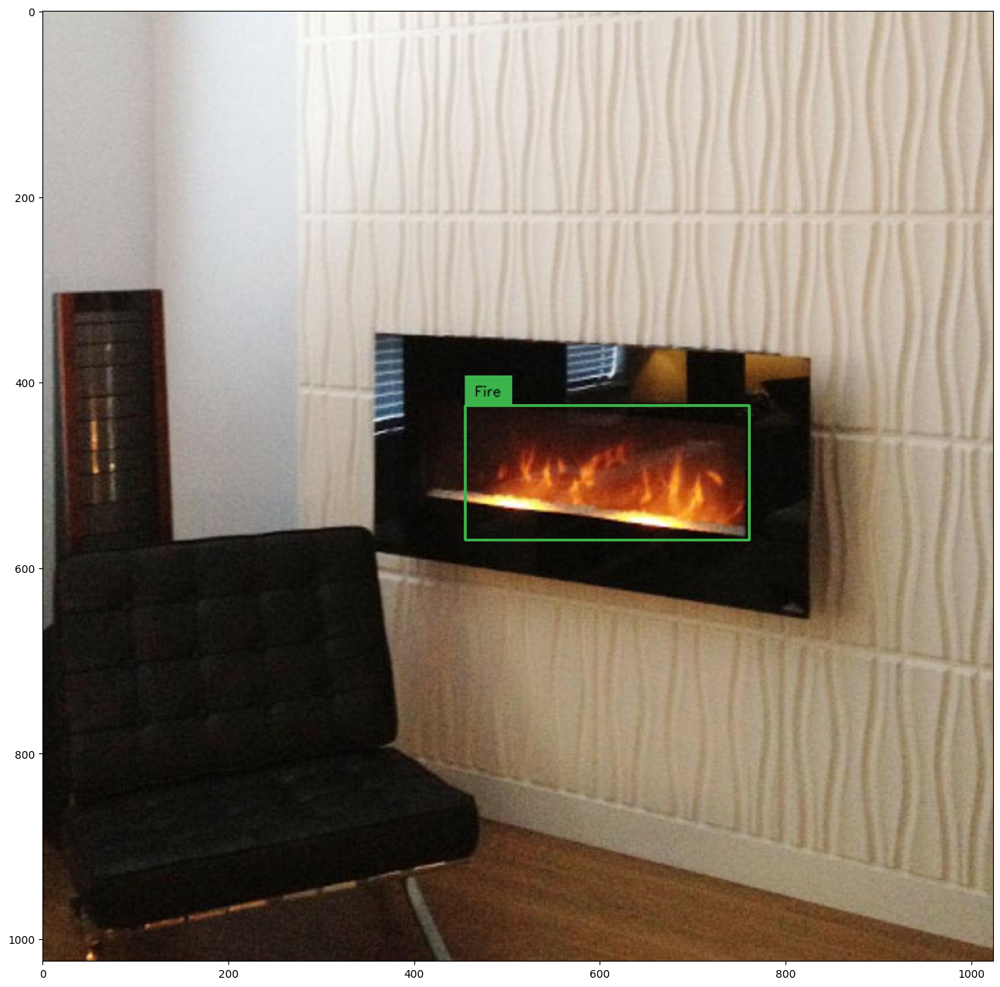

In [ ]:
# libraries
import random # to shuffle dataset
import cv2 # opencv for treating images
import numpy as np # calculus
import supervision as sv # manage annotations


# A random image
image_ids = TRAIN_DATASET.coco.getImgIds()
image_id = random.choice(image_ids) # selected by id
print('Image #{}'.format(image_id))

# loading image and its annotations
image = TRAIN_DATASET.coco.loadImgs(image_id)[0] # loading image
annotations = TRAIN_DATASET.coco.imgToAnns[image_id] # loading annotations
image_path = os.path.join(TRAIN_DATASET.root, image['file_name']) # image path
image = cv2.imread(image_path) # reading image

# setting annotations as COCO format
detections = sv.Detections.from_coco_annotations(coco_annotation=annotations)

# dataset labels
categories = TRAIN_DATASET.coco.cats

id2label = {k: v['name'] for k,v in categories.items()}

labels = [
    f"{id2label[class_id]}"
    for _, _, class_id, _
    in detections
]

# annotations on the image
box_annotator = sv.BoxAnnotator() # annotator to the defined boxes
frame = box_annotator.annotate(scene=image.copy(), detections=detections, labels=labels) # drawing frames on a copy of the images

# showing images
%matplotlib inline
sv.show_frame_in_notebook(image, (16, 16)) # original image
sv.show_frame_in_notebook(frame, (16, 16)) # iamge with detection frames

In [ ]:
# labels: "none" expected in DETR model, and "fire" as detected object

{0: {'id': 0, 'name': 'Fire-and-No-fire', 'supercategory': 'none'},
 1: {'id': 1, 'name': 'Fire', 'supercategory': 'Fire-and-No-fire'}}

## Trainning model by PyTorch Lightning

Dataloader class used to work with images, both trainning or test ones. A function (collate_fn) is needed in order to adapt image sizes, as in trainning phase every image is located into a unique image size used by the dataloader. So the model could pay attention to the image, and not to the "empty" frame until fill the common size.



In [ ]:
# libraries to load dataset
from torch.utils.data import DataLoader

def collate_fn(batch):
  # DETR author uses different image sizes for trainning, so fullfill a common
  # size (max batch image size resolution) was needed. A binary mask determine
  # whether a pixel is part of the target image or not.


    pixel_values = [item[0] for item in batch] # image
    encoding = image_processor.pad(pixel_values, return_tensors="pt") # image pad
    labels = [item[1] for item in batch] # label
    return {
        'pixel_values': encoding['pixel_values'],
        'pixel_mask': encoding['pixel_mask'],
        'labels': labels
    }

# collate_fn get a list of tuples __getitem__ from Dataset class

TRAIN_DATALOADER = DataLoader(dataset=TRAIN_DATASET, collate_fn=collate_fn, batch_size=4, shuffle=True)
TEST_DATALOADER = DataLoader(dataset=TEST_DATASET, collate_fn=collate_fn, batch_size=4)

Creating DETR class as [pytorch lightningmodel](https://lightning.ai/docs/pytorch/stable/common/lightning_module.html
), including needed methods fro trainning and inference.

In [ ]:
import pytorch_lightning as pl

class Detr(pl.LightningModule):

    def __init__(self, lr, lr_backbone, weight_decay):
        super().__init__()
        self.model = DetrForObjectDetection.from_pretrained(
            pretrained_model_name_or_path=MODEL_ORIGIN,
            num_labels=len(id2label),
            ignore_mismatched_sizes=True
        )

        self.lr = lr
        self.lr_backbone = lr_backbone # different learning rates for transformer or backbone model
        self.weight_decay = weight_decay

    def forward(self, pixel_values, pixel_mask):
        return self.model(pixel_values=pixel_values, pixel_mask=pixel_mask) # padding image mask

    def common_step(self, batch, batch_idx):
        pixel_values = batch["pixel_values"]
        pixel_mask = batch["pixel_mask"]
        labels = [{k: v.to(self.device) for k, v in t.items()} for t in batch["labels"]]

        outputs = self.model(pixel_values=pixel_values, pixel_mask=pixel_mask, labels=labels)

        loss = outputs.loss
        loss_dict = outputs.loss_dict

        return loss, loss_dict

    def training_step(self, batch, batch_idx):
        loss, loss_dict = self.common_step(batch, batch_idx)
        # logs metrics for each training_step, and the average across the epoch
        self.log("training_loss", loss)
        for k,v in loss_dict.items():
            self.log("train_" + k, v.item())

        return loss

    def validation_step(self, batch, batch_idx):
        loss, loss_dict = self.common_step(batch, batch_idx)
        self.log("validation/loss", loss)
        for k, v in loss_dict.items():
            self.log("validation_" + k, v.item())

        return loss

    def configure_optimizers(self):
        # DETR authors decided to use different learning rate for backbone
        # you can learn more about it here:
        # - https://github.com/facebookresearch/detr/blob/3af9fa878e73b6894ce3596450a8d9b89d918ca9/main.py#L22-L23
        # - https://github.com/facebookresearch/detr/blob/3af9fa878e73b6894ce3596450a8d9b89d918ca9/main.py#L131-L139
        param_dicts = [
            {
                "params": [p for n, p in self.named_parameters() if "backbone" not in n and p.requires_grad]},
            {
                "params": [p for n, p in self.named_parameters() if "backbone" in n and p.requires_grad],
                "lr": self.lr_backbone,
            },
        ]
        return torch.optim.AdamW(param_dicts, lr=self.lr, weight_decay=self.weight_decay)

    def train_dataloader(self):
        return TRAIN_DATALOADER

We can debug by tensorboard:

In [ ]:
%cd {HOME}

%load_ext tensorboard
%tensorboard --logdir lightning_logs/

/content


<IPython.core.display.Javascript object>

In [ ]:
# hyperparameters definition
model = Detr(lr=1e-4, lr_backbone=1e-5, weight_decay=1e-4)

batch = next(iter(TRAIN_DATALOADER))

outputs = model(pixel_values=batch['pixel_values'], pixel_mask=batch['pixel_mask'])

Some weights of DetrForObjectDetection were not initialized from the model checkpoint at facebook/detr-resnet-50 and are newly initialized because the shapes did not match:
- class_labels_classifier.weight: found shape torch.Size([92, 256]) in the checkpoint and torch.Size([3, 256]) in the model instantiated
- class_labels_classifier.bias: found shape torch.Size([92]) in the checkpoint and torch.Size([3]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [ ]:
outputs.logits.shape # (batch_size, num_queries, number of classes + 1)

torch.Size([4, 100, 3])

Aquí realizamos el entrenamiento de manera simplificada gracias a la clase [Trainer](https://lightning.ai/docs/pytorch/stable/common/trainer.html) de pytorch lightning.

In [ ]:
from pytorch_lightning import Trainer

%cd {HOME}

# configuration
MAX_EPOCHS = 50
N_DEVICES = 1
ACCELERATOR = "gpu"
GRADIENT_CLIP_VAL = 0.1
ACCUMULATE_GRAD_BATCHES = 3
LOG_EVERY_N_STEPS=5

# pytorch_lightning < 2.0.0
# trainer = Trainer(gpus=1, max_epochs=MAX_EPOCHS, gradient_clip_val=0.1, accumulate_grad_batches=8, log_every_n_steps=5)

# pytorch_lightning >= 2.0.0
trainer = Trainer(devices=N_DEVICES, accelerator=ACCELERATOR, max_epochs=MAX_EPOCHS,
                  gradient_clip_val=GRADIENT_CLIP_VAL, accumulate_grad_batches=ACCUMULATE_GRAD_BATCHES,
                  log_every_n_steps=LOG_EVERY_N_STEPS)

# trainning
trainer.fit(model)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


/content


You defined a `validation_step` but have no `val_dataloader`. Skipping val loop.
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name  | Type                   | Params
-------------------------------------------------
0 | model | DetrForObjectDetection | 41.5 M
-------------------------------------------------
41.3 M    Trainable params
222 K     Non-trainable params
41.5 M    Total params
166.038   Total estimated model params size (MB)


Training: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=50` reached.


## Model inference
Checking results randomly.

In [ ]:
# loading model to device (gpu, cpu, ...)
model.to(DEVICE)

# configuration
CONFIDENCE_TRESHOLD = 0.3 # in order to fiilter the accuracy needed to show results
IOU_THRESHOLD = 0.1 # NMS

Loading image to it evaluation, with annotations.
Finally, results and test image are shown. Take into account the "confidence filter" and [NMS]( https://blog.roboflow.com/how-to-code-non-maximum-suppression-nms-in-plain-numpy/)


Image #469
ground truth


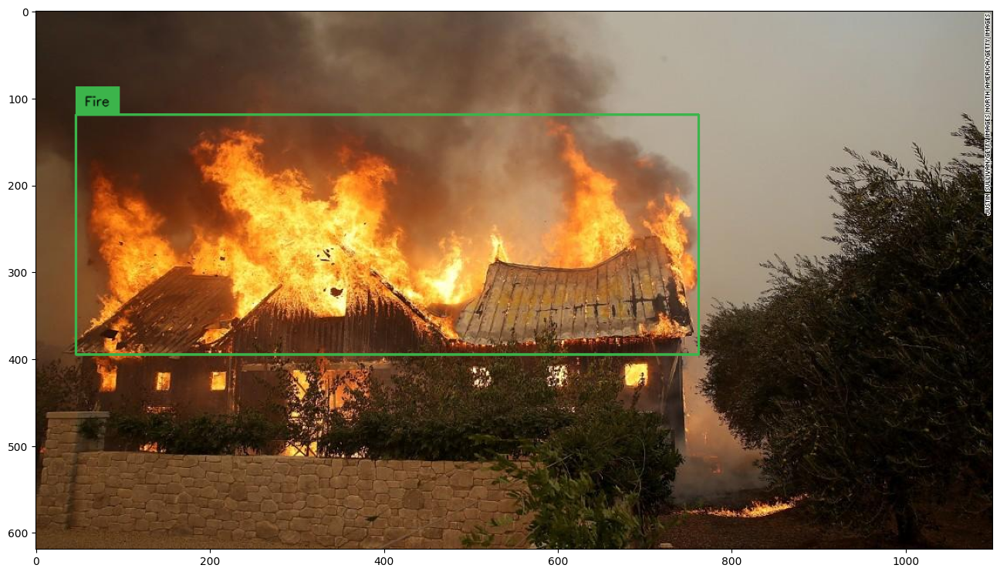

{'scores': tensor([0.4939, 0.6844, 0.3070, 0.9005, 0.4993, 0.7978, 0.4045, 0.3942, 0.3350,
        0.9512, 0.9587], device='cuda:0'), 'labels': tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0'), 'boxes': tensor([[317.7433, 131.9247, 725.2444, 353.9475],
        [277.8481, 494.0025, 319.3932, 512.4791],
        [ 46.9997, 134.3139, 759.0672, 367.3833],
        [125.7094, 492.8453, 151.1658, 506.0684],
        [ 44.9413, 132.8457, 778.2217, 518.0287],
        [779.9586, 558.8963, 862.4067, 582.0899],
        [337.5246, 130.9010, 761.1951, 357.0529],
        [127.2921, 494.1591, 146.4088, 507.0370],
        [ 65.6104, 135.9622, 684.2449, 360.5773],
        [277.1198, 492.8069, 324.8653, 514.1064],
        [674.8246, 402.9510, 711.5867, 433.9300]], device='cuda:0')}
detections


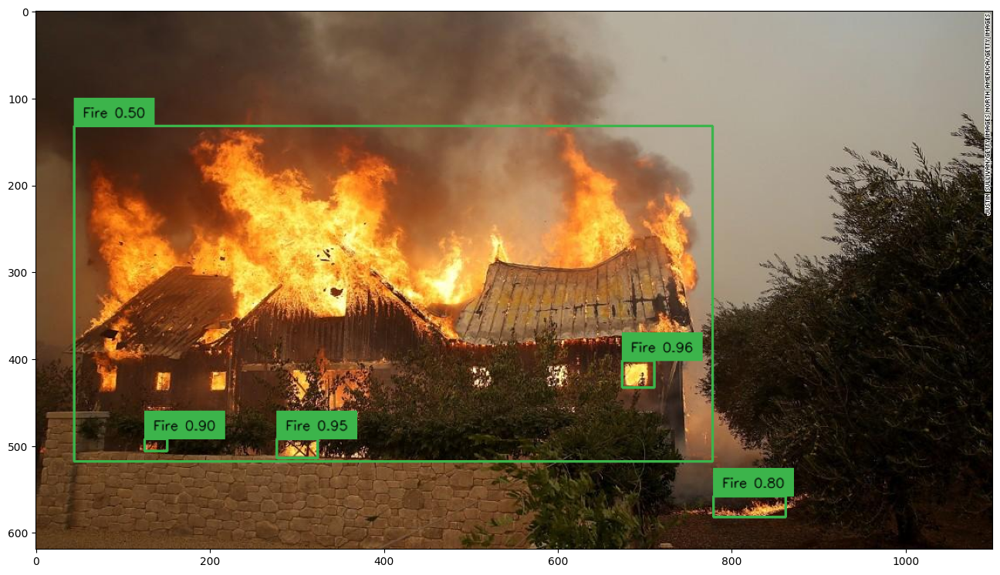

In [ ]:
# libraries
import random # random selection
import cv2 # to show images
import numpy as np # calculus
import supervision as sv # annotations


# utils
categories = TEST_DATASET.coco.cats # dataset vategories
id2label = {k: v['name'] for k,v in categories.items()} # identifying labels
box_annotator = sv.BoxAnnotator()  # annotation class

# random image selection
image_ids = TEST_DATASET.coco.getImgIds() # loading by ids
image_id = random.choice(image_ids) # select one
print('Image #{}'.format(image_id))

# loading image and annotation
image = TEST_DATASET.coco.loadImgs(image_id)[0] # iamge by id
image_path = os.path.join(TEST_DATASET.root, image['file_name']) # search image
image = cv2.imread(image_path) # load image

# test annotation
annotations = TEST_DATASET.coco.imgToAnns[image_id] # loading image annotations
detections = sv.Detections.from_coco_annotations(coco_annotation=annotations) # push to coco class
labels = [f"{id2label[class_id]}" for _, _, class_id, _ in detections] # labels identification
frame = box_annotator.annotate(scene=image.copy(), detections=detections, labels=labels) # drawing frames

# Show test image
print('ground truth')
%matplotlib inline
sv.show_frame_in_notebook(frame, (16, 16))

# inference
with torch.no_grad(): # removing gradient update option, to ensure not to train the model

    # loading image and predict results
    inputs = image_processor(images=image, return_tensors='pt').to(DEVICE) # to device (GPU, CPU, ...)
    model.to(DEVICE) # model to device (GPU, CPU, ...)
    outputs = model(**inputs) # predict

    # post-process
    target_sizes = torch.tensor([image.shape[:2]]).to(DEVICE) # image to device
    results = image_processor.post_process_object_detection( # results
        outputs=outputs,
        threshold=CONFIDENCE_TRESHOLD,
        target_sizes=target_sizes
    )[0] # list of dictionaries: with accuracy, label and boxes by batch

print(results)

# anotation
detections = sv.Detections.from_transformers(transformers_results=results).with_nms(threshold=IOU_THRESHOLD)
labels = [f"{id2label[class_id]} {confidence:.2f}" for _, confidence, class_id, _ in detections]
frame = box_annotator.annotate(scene=image.copy(), detections=detections, labels=labels)

print('detections')
%matplotlib inline
sv.show_frame_in_notebook(frame, (16, 16))

## Dataset evaluation
Finally, we evaluate the model by TEST_DATASET. Using CocoEvaluator, available in Pypi package, and developed by Niels Rogge. This class is based on the original evaluator from DETR authors.

In [ ]:
!pip install -q coco_eval

In [ ]:
def convert_to_xywh(boxes):
  """
  Extracción y cambio de coordenadas de las cajas de anotación.
  """
    xmin, ymin, xmax, ymax = boxes.unbind(1)
    return torch.stack((xmin, ymin, xmax - xmin, ymax - ymin), dim=1)

def prepare_for_coco_detection(predictions):
  """
  Convertir predicciones a una lista de diccionarios
  sobre la información de las imágenes.

  Args:
    predictions (dict)

  Returns:
    coco_results (list)
  """
    coco_results = []
    for original_id, prediction in predictions.items(): # predictions
        if len(prediction) == 0:
            continue

        boxes = prediction["boxes"]
        boxes = convert_to_xywh(boxes).tolist()
        scores = prediction["scores"].tolist()
        labels = prediction["labels"].tolist()

        coco_results.extend( # Dict that define the image
            [
                {
                    "image_id": original_id,
                    "category_id": labels[k],
                    "bbox": box,
                    "score": scores[k],
                }
                for k, box in enumerate(boxes) # box iteration
            ]
        )
    return coco_results


In [ ]:
from coco_eval import CocoEvaluator, evaluate
from tqdm.notebook import tqdm

import numpy as np

# loading evaluator with dataset and evaluation element type
evaluator = CocoEvaluator(coco_gt=TEST_DATASET.coco, iou_types=["bbox"])
# doc: https://github.com/pytorch/vision/blob/main/references/detection/coco_eval.py

print("Running evaluation...")

for idx, batch in enumerate(tqdm(TEST_DATALOADER)):
    pixel_values = batch["pixel_values"].to(DEVICE) # total image
    pixel_mask = batch["pixel_mask"].to(DEVICE) # mask
    labels = [{k: v.to(DEVICE) for k, v in t.items()} for t in batch["labels"]] # labels

    with torch.no_grad(): # forcing no train
      outputs = model(pixel_values=pixel_values, pixel_mask=pixel_mask) # executing model

    orig_target_sizes = torch.stack([target["orig_size"] for target in labels], dim=0) # original size
    results = image_processor.post_process_object_detection(outputs, target_sizes=orig_target_sizes) # results

    predictions = {target['image_id'].item(): output for target, output in zip(labels, results)}
    predictions = prepare_for_coco_detection(predictions) # prediction resutls
    evaluator.update(predictions)

evaluator.synchronize_between_processes()

# append results
evaluator.accumulate()
evaluator.summarize()


## Save and load model

In [ ]:
import torch
from transformers import DetrForObjectDetection, DetrImageProcessor

In [ ]:
MODEL_PATH = os.path.join(HOME, 'custom-model')

How to save the model:

In [ ]:
model.model.save_pretrained(MODEL_PATH)

How to load the model:

In [ ]:
model = DetrForObjectDetection.from_pretrained(MODEL_PATH)
model.to(DEVICE)

# Download Colab content

In [ ]:
from google.colab import files

for i in os.listdir(MODEL_PATH):
  print(i)
  files.download(MODEL_PATH +'/'+ i)

Download everything to a .zip.

In [ ]:
!zip -r '/custom_model.zip' './custom-model'
files.download('/custom_model.zip')

# Using the model with an image:


In [ ]:
from transformers import AutoImageProcessor, DetrForObjectDetection
import torch
from PIL import Image
import requests

url = "http://images.cocodataset.org/val2017/000000039769.jpg"
image = Image.open(requests.get(url, stream=True).raw)

# image_processor = AutoImageProcessor.from_pretrained("facebook/detr-resnet-50")
# model = DetrForObjectDetection.from_pretrained("facebook/detr-resnet-50")

inputs = image_processor(images=image, return_tensors="pt").to(DEVICE)
outputs = model(**inputs)

# convert outputs (bounding boxes and class logits) to COCO API
target_sizes = torch.tensor([image.size[::-1]])
results = image_processor.post_process_object_detection(outputs, threshold=0.9, target_sizes=target_sizes)[
    0
]

for score, label, box in zip(results["scores"], results["labels"], results["boxes"]):
    box = [round(i, 2) for i in box.tolist()]
    print(
        f"Detected {model.config.id2label[label.item()]} with confidence "
        f"{round(score.item(), 3)} at location {box}"
    )

Some references:
- Custom dataset trainning: https://towardsdatascience.com/training-detr-on-your-own-dataset-bcee0be05522

 DETR fork: https://github.com/aivclab/detr

- Example notebook: https://github.com/aivclab/detr/blob/master/finetune_detr.ipynb

- Example guide: https://github.com/NielsRogge/Transformers-Tutorials/blob/master/DETR/Fine_tuning_DetrForObjectDetection_on_custom_dataset_(balloon).ipynb

- minimalist example: https://colab.research.google.com/github/NielsRogge/Transformers-Tutorials/blob/master/DETR/DETR_minimal_example_(with_DetrFeatureExtractor).ipynb

- Example with car number plates: https://www.kaggle.com/code/nouamane/fine-tuning-detr-for-license-plates-detection/notebook?scriptVersionId=83102158